**PROBLEM STATEMENT**
<br/>Predict the House price depending on depending on the date of purchase, distance from local institutes, location etc.
<br/>Get Sample data from Source- https://archive.ics.uci.edu/ml/datasets/Real+estate+valuation+data+set
<br/>
<br/>**COLUMN DEFINITION**
<br/>X1=the transaction date (for example, 2013.250=2013 March, 2013.500=2013 June, etc.)
<br/>X2=the house age (unit: year)
<br/>X3=the distance to the nearest MRT station (unit: meter)
<br/>X4=the number of convenience stores in the living circle on foot (integer)
<br/>X5=the geographic coordinate, latitude. (unit: degree)
<br/>X6=the geographic coordinate, longitude. (unit: degree)
<br/>The output is as follow:
<br/>Y= house price of unit area (10000 New Taiwan Dollar/Ping, where Ping is a local unit, 1 Ping = 3.3 meter squared)
<br/>
<br/>
<br/>**STEPS IN MODELLING**
<br/>1.Data Acquisation
<br/>2.Data understanding
<br/>3.Data visualisation/EDA
<br/>4.Data cleaning/missing imputation/typecasting
<br/>5.Sampling/ bias removal
<br/>6.Anomaly detection
<br/>7.Feature selection/importance
<br/>8.Azure ML Model trigger
<br/>9.Model Interpretation
<br/>10.Telemetry
<br/>
<br/>
<br/>**FEATURE ENGINEERING**
<br/>1. Lat long coordinates have a problem that they are 2 features that represent a three dimensional space. This means that the long coordinate goes all around, which means the two most extreme values are actually very close together. I've dealt with this problem a few times and what I do in this case is map them to x, y and z coordinates. This means close points in these 3 dimensions are also close in reality. Depending on the use case you can disregard the changes in height and map them to a perfect sphere. These features can then be standardized properly.
<br/>x = RadiusOfEarth * cos(lat) * cos(lon)
<br/>y = RadiusOfEarth * cos(lat) * sin(lon), 
<br/>z = RadiusOfEarth * sin(lat) 
<br/>Once we have the x,y,z coordinates, we can use x2 + y2 + z2 to get the distance from (0,0,0) which brings all locations to a standard scale. We can ignore the Radius of earth as we are anyway going to standardize the col.
<br/>2. Year column extraction from a date column to add attribute of the year of purchase.
<br/>3. Cluster sampling by 'X1 transaction year' as the data plots look skewed towards the year 2013>2012

## Import functions from Master Notebook:
Import the Functions and dependencies from the Master notebook to be used in the Trigger Notebook

In [0]:
%run /Users/.../AMLMasterNotebook

Python interpreter will be restarted.
Requirement already satisfied: azureml-train-automl-runtime in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (1.33.0)
Requirement already satisfied: boto3<=1.15.18 in /databricks/python3/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.12.0)
Requirement already satisfied: azureml-train-automl-client~=1.33.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.33.0)
Requirement already satisfied: jinja2<=2.11.2 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (2.11.2)
Requirement already satisfied: botocore<=1.18.18 in /databricks/python3/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.15.0)
Requirement already satisfied: onnxruntime<=1.8.0,>=1.3.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.8.0)
Requirement already satisfied: onnxconverter-common<=1.6.0,>=1.4.2 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.6.0)
Requirement already satisfied: lightgbm<=2.3.0,>=2.0.11 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (2.3.0)
Requirement already satisfied: numpy<1.19.0,>=1.16.0 in /databricks/python3/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.18.1)
Requirement already satisfied: smart-open<=1.9.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.9.0)
Requirement already satisfied: azureml-interpret~=1.33.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.33.0)
Requirement already satisfied: pandas<1.0.0,>=0.21.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (0.25.3)
Requirement already satisfied: skl2onnx==1.4.9 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.4.9)
Requirement already satisfied: azureml-defaults~=1.33.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.33.0)
Requirement already satisfied: azureml-telemetry~=1.33.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.33.0)
Requirement already satisfied: azure-storage-queue~=12.1 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (12.1.6)
Requirement already satisfied: azureml-automl-runtime~=1.33.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.33.0)
Requirement already satisfied: azureml-dataset-runtime[fuse,pandas]~=1.33.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (1.33.0)
Requirement already satisfied: dask[complete]<=2.30.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from azureml-train-automl-runtime) (2.30.0)
Requirement already satisfied: sklearn-pandas<=1.7.0,>=1.4.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/p

Versions:
- scipy = 1.5.2
- numpy = 1.18.1
- matplotlib = 3.4.3
- pandas = 0.25.3
- sklearn = 0.23.1

DEV
keyAdls: String = psinsightsspn
credentialAdls: String = psinsightsspnkey
envType: String = DEV
envname: String = DEV
databricksScope: String = OMIEnggDEV-KeyVault-Secrets
adls_storageacc: String = psinsightsadlsdev
envfoldername: String = PPE
adlsLoginUrl: String = https://login.microsoftonline.com/72f988bf-86f1-41af-91ab-2d7cd011db47/oauth2/token
decryptedADLSId: String = [REDACTED]
decryptedADLSCredential: String = [REDACTED]

## 1.Data Acquisition
1.Acquisition of data from datasource ADLS path in CSV/Parquet/JSON etc format.
<br/>2.Logical Transformations in data. 
<br/>3.Transforming columns into required datatypes, converting to pandas df, persisiting actual dataset, intoducing a column 'Index' to assign a unique identifier to each dataset row so that this canm be used to retrieve back the original form after any data manupulations.

In [0]:
%scala
//<USER INPUT FILEPATH PARQUET OR CSV>

val filepath= "adl://<Your ADLS Name>.azuredatalakestore.net/.../RealEstateData.csv"
var df=spark.read.format("csv").option("header", "true").option("delimiter", ",").load(filepath)
//val filepath ="abfss:/.../.parquet"
//var df = spark.read.parquet(filepath)
df.createOrReplaceTempView("vw")

In [0]:
df= spark.sql("""select * , ROUND((x*x + y*y + z*z),4) AS Distance from
(select 
`Index`
--,`X1 transaction date`
,`X2 house age`
,`X3 distance to the nearest MRT station`
,`X4 number of convenience stores`
--,`X5 latitude`
--,`X6 longitude`
,`Y house price of unit area`
,LEFT(`X1 transaction date`,4) AS `X1 transaction year`
,ROUND(ABS(cos(`X5 latitude`) * cos(`X6 longitude`)),4) AS x
,ROUND(ABS(cos(`X5 latitude`) * sin(`X6 longitude`)),4) AS y
,ROUND(ABS(sin(`X5 latitude`)),4) AS z
 from vw)""")

In [0]:
import pandas as pd
import numpy as np
from pyspark.sql.functions import col
##df.select(*(col(c).cast("float").alias(c) for c in df.columns))
#cols=df.columns
#cols.remove('Index')
#for col_name in cols:
#    df = df.withColumn(col_name, col(col_name).cast('float'))
#for col_name in ['Index']:
#    df = df.withColumn(col_name, col(col_name).cast('Int'))   

# <USER INPUT COLUMN NAMES WITH DATAYPES IN RESPECTIVE BUCKET>
cols_all=[
'Index'
,'X2 house age'
,'X3 distance to the nearest MRT station'
,'X4 number of convenience stores'
,'Y house price of unit area'
,'X1 transaction year'
,'x'
,'y'
,'z' 
,'Distance'
]
cols_string=['X1 transaction year']
cols_int=['Index']
cols_bool=[]
cols_Float=[
'X2 house age'
,'X3 distance to the nearest MRT station'
,'X4 number of convenience stores'
,'Y house price of unit area'
,'x'
,'y'
,'z' 
,'Distance'
]
for col_name in cols_int:
    df = df.withColumn(col_name, col(col_name).cast('Int'))  
for col_name in cols_Float:
    df = df.withColumn(col_name, col(col_name).cast('float')) 
for col_name in cols_bool:
    df = df.withColumn(col_name, col(col_name).cast('bool')) 
    
input_dataframe = df.toPandas()
#input_dataframe['Index'] = np.arange(len(input_dataframe))
outdir = '/dbfs/FileStore/RealEstate.csv'
input_dataframe.to_csv(outdir, index=False)
#input_dataframe = pd.read_csv("/dbfs/FileStore/Dataframe.csv", header='infer')


## 2.Data Exploration
1.Exploratory Data Analysis (EDA)- To understand the overall data at hand, analysing each feature independently for its' statistics, the correlation and interraction between variables, data sample etc. 
<br/>2.Data Profiling Plots- To analyse the Categorical and Numerical columns separately for any trend in data, biasness in data etc.

In [0]:
input_dataframe = pd.read_csv("/dbfs/FileStore/RealEstate.csv", header='infer')

p=Data_Profiling_viaPandasProfiling(input_dataframe,'RealEstate','EDA')
displayHTML(p)


Summarize dataset: 0%| | 0/23 [00:00<?, ?it/s]Summarize dataset: 0%| | 0/23 [00:00<?, ?it/s, Describe variable:X1 transaction year]Summarize dataset: 4%|▍ | 1/23 [00:00<00:02, 10.12it/s, Describe variable:X4 number of convenience stores]Summarize dataset: 9%|▊ | 2/23 [00:00<00:01, 19.82it/s, Describe variable:X4 number of convenience stores]Summarize dataset: 9%|▊ | 2/23 [00:00<00:01, 19.82it/s, Describe variable:Distance] Summarize dataset: 13%|█▎ | 3/23 [00:00<00:01, 19.82it/s, Describe variable:y] Summarize dataset: 17%|█▋ | 4/23 [00:00<00:00, 19.82it/s, Describe variable:Index]Summarize dataset: 22%|██▏ | 5/23 [00:00<00:00, 19.82it/s, Describe variable:x] Summarize dataset: 26%|██▌ | 6/23 [00:00<00:00, 19.82it/s, Describe variable:X2 house age]Summarize dataset: 30%|███ | 7/23 [00:00<00:00, 19.82it/s, Describe variable:Y house price of unit area]Summarize dataset: 35%|███▍ | 8/23 [00:00<00:00, 19.82it/s, Describe variable:X3 distance to the nearest MRT station]Summarize dataset: 39%|███▉ | 9/23 [00:00<00:00, 19.82it/s, Describe variable:z] Summarize dataset: 43%|████▎ | 10/23 [00:00<00:00, 19.82it/s, Get variable types]Summarize dataset: 48%|████▊ | 11/23 [00:00<00:00, 59.42it/s, Get variable types]Summarize dataset: 48%|████▊ | 11/23 [00:00<00:00, 59.42it/s, Calculate pearson correlation]Summarize dataset: 52%|█████▏ | 12/23 [00:00<00:00, 59.42it/s, Calculate spearman correlation]Summarize dataset: 57%|█████▋ | 13/23 [00:00<00:00, 59.42it/s, Calculate kendall correlation] Summarize dataset: 61%|██████ | 14/23 [00:00<00:00, 59.42it/s, Calculate phi_k correlation] Summarize dataset: 65%|██████▌ | 15/23 [00:01<00:00, 59.42it/s, Calculate cramers correlation]Summarize dataset: 70%|██████▉ | 16/23 [00:01<00:00, 59.42it/s, Get scatter matrix] Summarize dataset: 74%|███████▍ | 17/23 [00:10<00:04, 1.34it/s, Get scatter matrix]Summarize dataset: 74%|███████▍ | 17/23 [00:10<00:04, 1.34it/s, Get table statistics]Summarize dataset: 78%|███████▊ | 18/23 [00:10<00:03, 1.34it/s, Get missing diagrams]Summarize dataset: 83%|████████▎ | 19/23 [00:10<00:02, 1.34it/s, Take sample] Summarize dataset: 87%|████████▋ | 20/23 [00:10<00:02, 1.34it/s, Locating duplicates]Summarize dataset: 91%|█████████▏| 21/23 [00:10<00:01, 1.80it/s, Locating duplicates]Summarize dataset: 91%|█████████▏| 21/23 [00:10<00:01, 1.80it/s, Get messages/warnings]Summarize dataset: 96%|█████████▌| 22/23 [00:10<00:00, 1.80it/s, Get reproduction details]Summarize dataset: 100%|██████████| 23/23 [00:10<00:00, 1.80it/s, Completed] Summarize dataset: 100%|██████████| 23/23 [00:10<00:00, 2.20it/s, Completed]
Generate report structure: 0%| | 0/1 [00:00<?, ?it/s]Generate report structure: 100%|██████████| 1/1 [00:04<00:00, 4.15s/it]Generate report structure: 100%|██████████| 1/1 [00:04<00:00, 4.15s/it]
Render HTML: 0%| | 0/1 [00:00<?, ?it/s]Render HTML: 100%|██████████| 1/1 [00:01<00:00, 1.89s/it]Render HTML: 100%|██████████| 1/1 [00:01<00:00, 1.89s/it]
Export report to file: 0%| | 0/1 [00:00<?, ?it/s]Export report to file: 100%|██████████| 1/1 [00:00<00:00, 6.13it/s]Export report to file: 100%|██████████| 1/1 [00:00<00:00, 6.12it/s]
EDA Report can be downloaded from path: adl://psinsightsadlsdev01.azuredatalakestore.net/DEV/EDAProfile_RealEstate.html

Number of variables,10
Number of observations,414
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,32.5 KiB
Average record size in memory,80.3 B
Numeric,8
Categorical,2
X3 distance to the nearest MRT station is highly correlated with X4 number of convenience stores and 4 other fields,High correlation


Count plots to identify if any biasness due to data skewness in Categorical columns

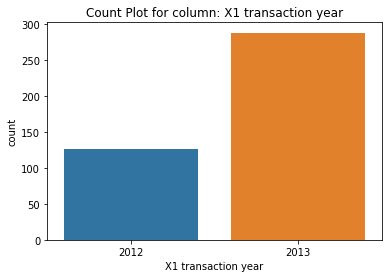

Box distribution plots to identify if any biasness of Categorical columns in determining label col

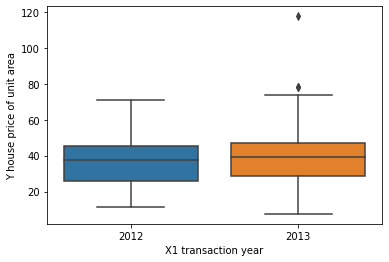

Distribution plots to identify if any biasness due to data skewness in Numerical columns

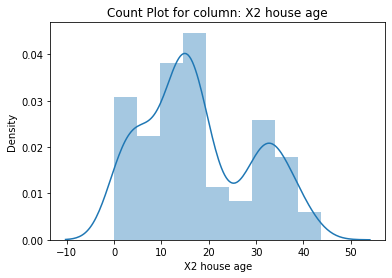

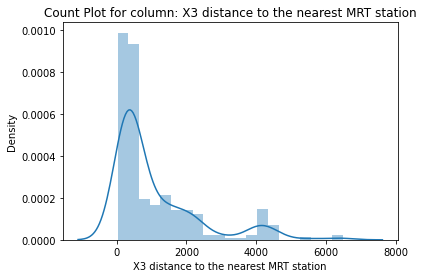

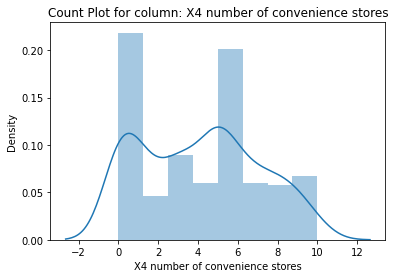

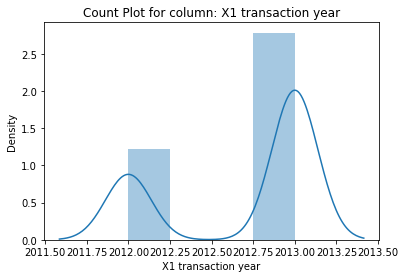

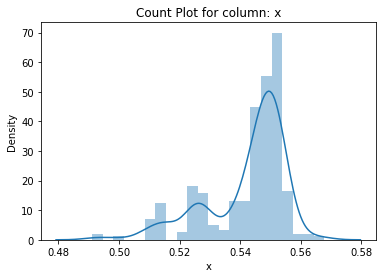

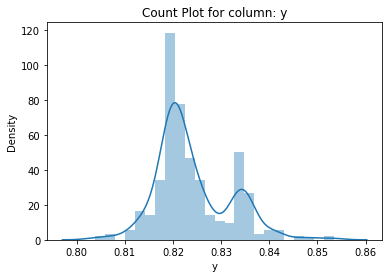

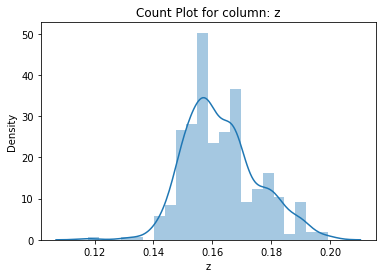

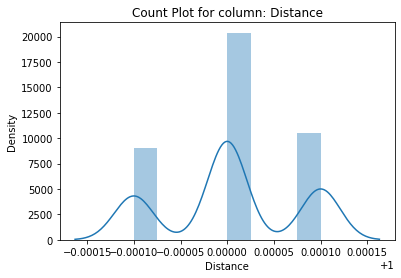

In [0]:
input_dataframe = pd.read_csv("/dbfs/FileStore/RealEstate.csv", header='infer')

#User Inputs
cols_all=[
'Index'
,'X2 house age'
,'X3 distance to the nearest MRT station'
,'X4 number of convenience stores'
,'Y house price of unit area'
,'X1 transaction year'
,'x'
,'y'
,'z' 
,'Distance'
]
Categorical_cols=['X1 transaction year'
]
Numeric_cols=['X2 house age'
,'X3 distance to the nearest MRT station'
,'X4 number of convenience stores'
,'X1 transaction year'
,'x'
,'y'
,'z' 
,'Distance'
]
Label_col='Y house price of unit area'

#Data_Profiling_Plots(input_dataframe,Categorical_cols,Numeric_cols,Label_col)
Data_Profiling_Plots(input_dataframe,Categorical_cols,Numeric_cols,Label_col)

## 3.Sampling
Perform Stratified, Systematic, Random, Cluster sampling over data and compare the so obtained sampled dataset with the original data using a NULL Hypothesis, and suggest the best sample obtained thus. Compare the data densities of sampled datasets with that of the original input dataset to validate that our sample matches the data trend of original set.

In [0]:
input_dataframe = pd.read_csv("/dbfs/FileStore/RealEstate.csv", header='infer')
subsample_final = pd.DataFrame()
subsample1 = pd.DataFrame()
subsample2 = pd.DataFrame()
subsample3 = pd.DataFrame()
subsample4 = pd.DataFrame()

#Sampling(input_dataframe,task_type,input_appname,cluster_classified_col_ifany(Supervised))
subsample_final,subsample1,subsample2,subsample3,subsample4=Sampling(input_dataframe,"/dbfs/FileStore/RealEstate.csv",'Sampling','RealEstate','X1 transaction year')

#persist sampled data sets 
filepath1 = '/dbfs/FileStore/StratifiedSampled_RealEstate.csv'
subsample1.to_csv(filepath1, index=False)
filepath2 = '/dbfs/FileStore/RandomSampled_RealEstate.csv'
subsample2.to_csv(filepath2, index=False)
filepath3 = '/dbfs/FileStore/SystematicSampled_RealEstate.csv'
subsample3.to_csv(filepath3, index=False)
filepath4 = '/dbfs/FileStore/ClusterSampled_RealEstate.csv'
subsample4.to_csv(filepath4, index=False)
filepath = '/dbfs/FileStore/subsample_final_RealEstate.csv'
subsample_final.to_csv(filepath, index=False)

Stratified Sampling
Stratified Sampling starting
Data Summary before sampling: 
Class=0, n=207 (50.000%)
Class=1, n=207 (50.000%)
Data Summary after sampling: 
Class=0, n=101 (50.000%)
Class=1, n=101 (50.000%)
Volume of actual dataset = 414
Volume of Sampled dataset = 162
Sampling Error for actual_size=414 sample_size=162 is 7.857% 
Stratified Sample accepted-via KS and Chi_square Null hypothesis
Average p-value between sample and actual (the bigger the p-value the closer the two datasets are.)= 0.8551745970533577

 Random Sampling
Random Sampling starting
Volume of actual dataset = 414
Volume of Sampled dataset = 203
Sampling Error for actual_size=414 sample_size=203 is 7.019% 
Random Sample accepted-via KS and Chi_square Null hypothesis
Average p-value between sample and actual(the bigger the p-value the closer the two datasets are.)= 0.8284438011232058

 Systematic Sampling
Systematic Sampling starting
Volume of actual dataset = 414
Volume of Sampled dataset = 207
Sampling Error for actual_size=414 sample_size=207 is 6.950% 
Systematic Sample accepted-via KS and Chi_square Null hypothesis
Average p-value between sample and actual(the bigger the p-value the closer the two datasets are.)= 0.9855984610056561

 Cluster Sampling
Length of actual input data= 414
Cluster sampling with SMOTE starting
Data Summary before sampling
Class=0, n=126 (30.435%)
Class=1, n=288 (69.565%)
Data Summary after SMOTE
Class=0, n=288 (50.000%)
Class=1, n=288 (50.000%)
Volume of actual dataset = 576
Volume of Sampled dataset = 576
Sampling Error for actual_size=576 sample_size=576 is 4.167% 
Cluster Sample accepted-via KS and Chi_square Null hypothesis
Average p-value between sample and actual(the bigger the p-value the closer the two datasets are.)= 1.0

 Best Suggested Sample is - ClusterSampling

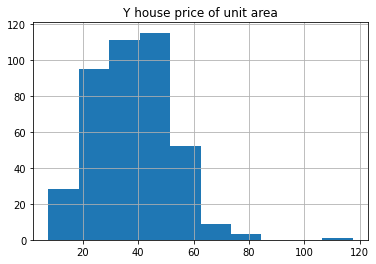

In [0]:
#input_dataframe = pd.read_csv("/dbfs/FileStore/RealEstate.csv", header='infer')

display(display_DataDistribution(input_dataframe,'Y house price of unit area'))

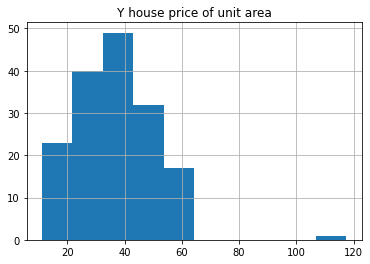

In [0]:
#subsample1 = pd.read_csv("/dbfs/FileStore/StratifiedSampled_RealEstate.csv", header='infer')

display(display_DataDistribution(subsample1,'Y house price of unit area'))

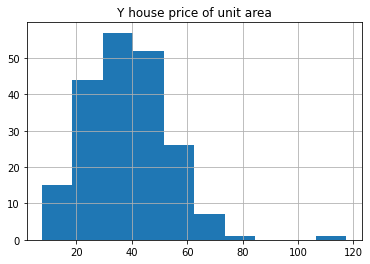

In [0]:
#subsample2 = pd.read_csv("/dbfs/FileStore/RandomSampled_RealEstate.csv", header='infer')

display(display_DataDistribution(subsample2,'Y house price of unit area'))

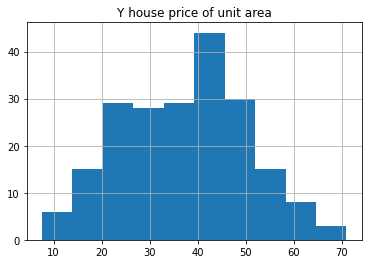

In [0]:
#subsample3 = pd.read_csv("/dbfs/FileStore/SystematicSampled_RealEstate.csv", header='infer')

display(display_DataDistribution(subsample3,'Y house price of unit area'))

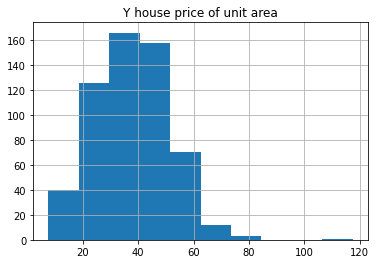

In [0]:
#subsample4 = pd.read_csv("/dbfs/FileStore/ClusterSampled_RealEstate.csv", header='infer')

display(display_DataDistribution(subsample4,'Y house price of unit area'))

## 4.Cleansing
To clean the data from NULL values, fix structural errors in columns, drop empty columns, encode the categorical values, normalise the data to bring to the same scale. We also check the Data Distribution via Correlation heatmap of original input dataset v/s the Cleansed dataset to validate whether or not the transformations hampered the original data trend/density.

In [0]:
subsample_final = pd.read_csv("/dbfs/FileStore/subsample_final_RealEstate.csv", header='infer')
#subsample_final=subsample_final.drop(['Index'], axis = 1) # Index is highest variability column hence always imp along PC but has no business value. You can append columns to be dropped by your choice here in the list

inputdf_new=autodatacleaner(subsample_final,"/dbfs/FileStore/subsample_final_RealEstate.csv","RealEstate","Data Cleanser")
print("Total rows in the new pandas dataframe:",len(inputdf_new.index))

#persist cleansed data sets 
filepath1 = '/dbfs/FileStore/Cleansed_RealEstate.csv'
inputdf_new.to_csv(filepath1, index=False)


Impute/Drop NULL Rows:
Total rows in the Input dataframe: 576
Total number of cells in the input dataframe: 6336
Displaying number of missing records per column:
Index 0
X2 house age 0
X3 distance to the nearest MRT station 0
X4 number of convenience stores 0
Y house price of unit area 0
X1 transaction year 0
x 0
y 0
z 0
Distance 0
Y 0
dtype: int64
Total no. of missing values= 0
The dataset contains 0.0 % missing values.

 Categorical columns cleansing:
Fixing inconsistent capitalization and removing any white spaces.
Label Encoding on categorical columns.
MinMax scaling for Normalisation.
Total rows in the new pandas dataframe: 576

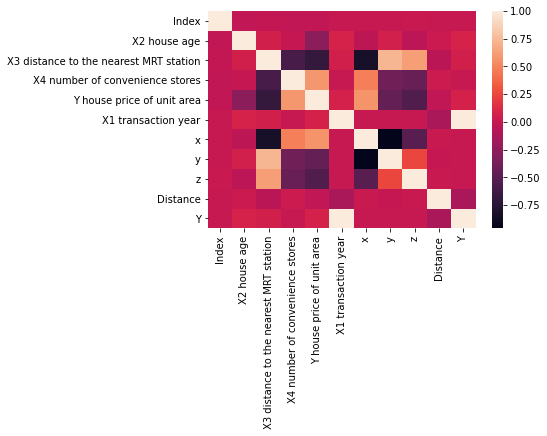

In [0]:
subsample_final = pd.read_csv("/dbfs/FileStore/subsample_final_RealEstate.csv", header='infer')

display(Data_Profiling_Fin(subsample_final))

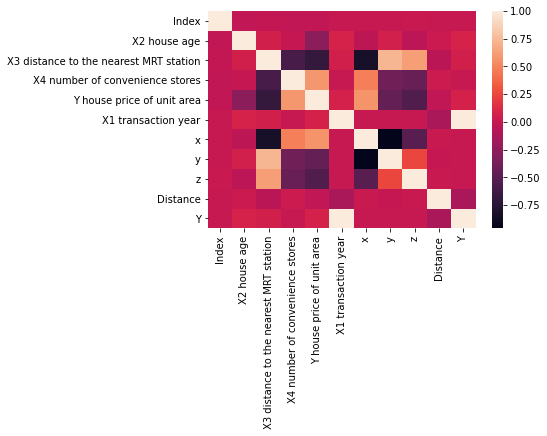

In [0]:
Cleansed=pd.read_csv("/dbfs/FileStore/Cleansed_RealEstate.csv", header='infer')

display(Data_Profiling_Fin(Cleansed))

## 5.Anomaly Detection
Iterate data over various Anomaly-detection techniques and estimate the number of Inliers and Outliers for each.

OUTLIERS : 31 INLIERS : 545 Angle-based Outlier Detector (ABOD)

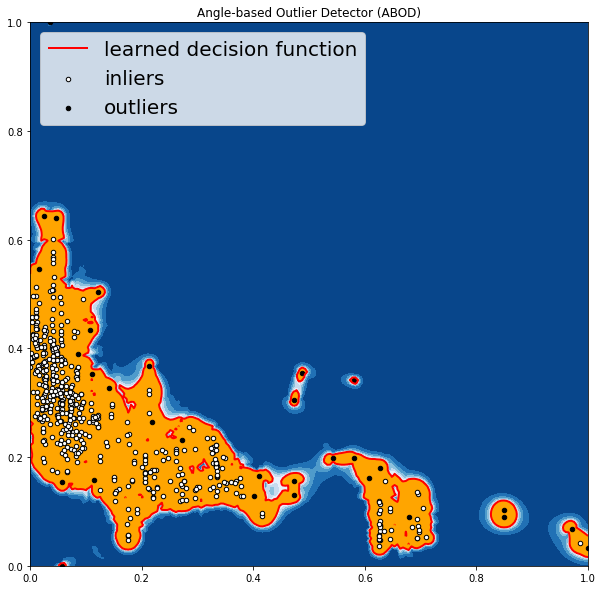

OUTLIERS : 29 INLIERS : 547 Cluster-based Local Outlier Factor (CBLOF)

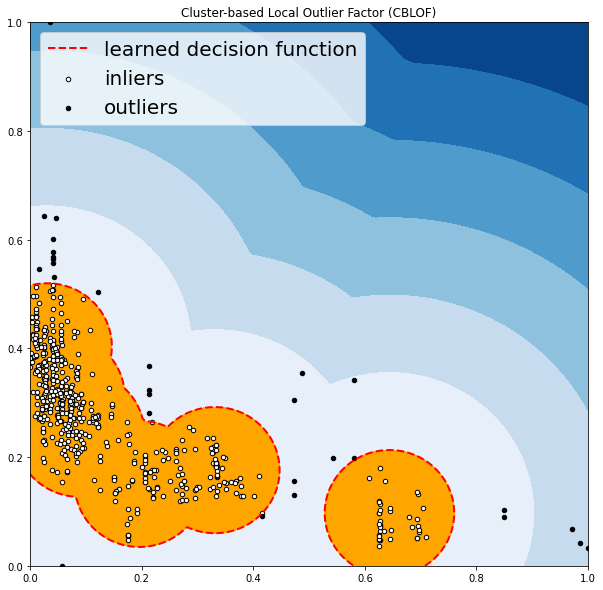

OUTLIERS : 17 INLIERS : 559 Histogram-base Outlier Detection (HBOS)

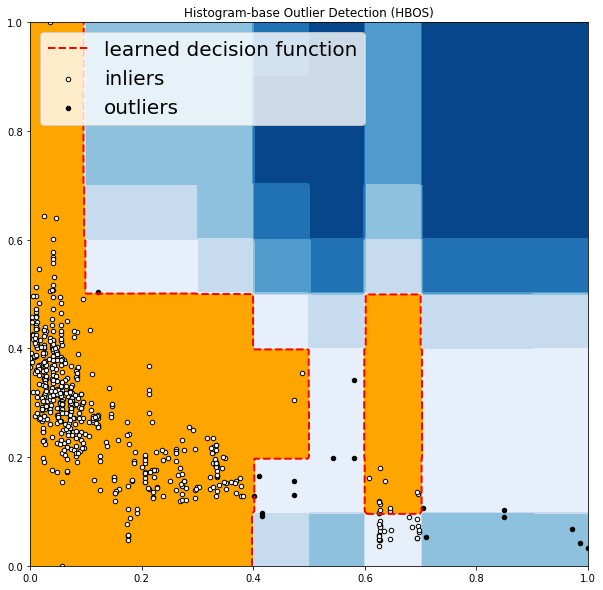

OUTLIERS : 29 INLIERS : 547 Isolation Forest

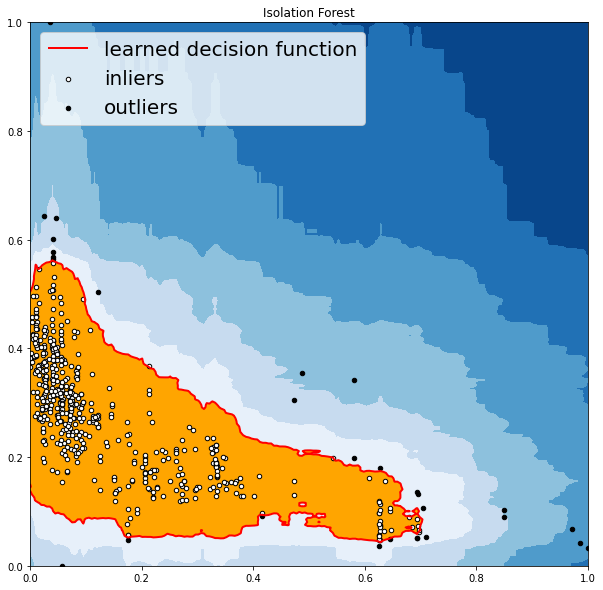

OUTLIERS : 24 INLIERS : 552 K Nearest Neighbors (KNN)

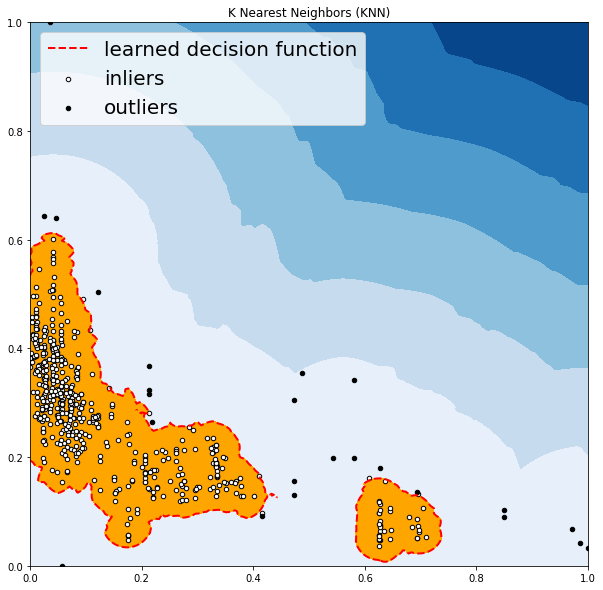

OUTLIERS : 18 INLIERS : 558 Average KNN

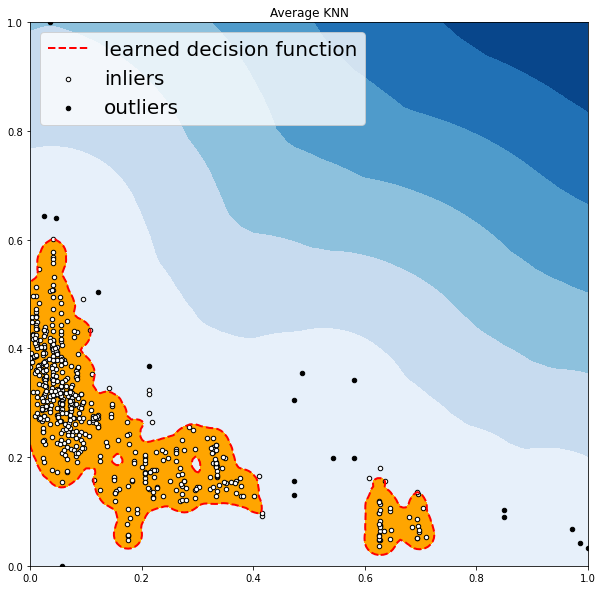

In [0]:
#Calling the Anamoly Detection Function for identifying outliers 
outliers_fraction = 0.05
df =pd.read_csv("/dbfs/FileStore/Cleansed_RealEstate.csv", header='infer')
target_variable = 'Y house price of unit area'
variables_to_analyze='X3 distance to the nearest MRT station'

AnomalyDetection(df,target_variable,variables_to_analyze,outliers_fraction,'anomaly_test','test')

## 6.Feature Selection
Perform feature selection on the basis of Feature Importance ranking, correlation values, variance within the column.
Choose features with High Importance value score, drop one of the two highly correlated features, drop features which offer zero variability to data and thus do not increase the entropy of dataset.

In [0]:
df =pd.read_csv("/dbfs/FileStore/Cleansed_RealEstate.csv", header='infer')
FeatureSelection(df,'Y house price of unit area','Continuous',"/dbfs/FileStore/Cleansed_RealEstate.csv",'RealEstate','FeatureSelection')

*Fetures Selection based on Decision tree Regressor
Bagged decision trees like Random Forest and Decision Trees can be used to estimate the importance of features. Larger score the more important the attribute.
Feature Importance values: 
 X3 distance to the nearest MRT station 0.577193
X2 house age 0.221621
x 0.068062
z 0.057335
X4 number of convenience stores 0.028189
y 0.024467
Distance 0.011015
Y 0.008525
X1 transaction year 0.003593
dtype: float64

 *Fetures Selection based on Correlation matrix
 X2 house age ... Y
X2 house age 1.000000 ... 0.078540
X3 distance to the nearest MRT station 0.054140 ... 0.052115
X4 number of convenience stores -0.004522 ... -0.001322
X1 transaction year 0.078540 ... 1.000000
x -0.042709 ... -0.002670
y 0.062931 ... -0.001707
z -0.049031 ... 0.004830
Distance 0.017021 ... -0.126717
Y 0.078540 ... 1.000000

[9 rows x 9 columns]
 X2 house age ... Y
X2 house age NaN ... 0.078540
X3 distance to the nearest MRT station NaN ... 0.052115
X4 number of convenience stores NaN ... -0.001322
X1 transaction year NaN ... 1.000000
x NaN ... -0.002670
y NaN ... -0.001707
z NaN ... 0.004830
Distance NaN ... -0.126717
Y NaN ... NaN

[9 rows x 9 columns]
Threshold o Correlation= 0.9
Highly Correlated columns- drop one of them. Columns to drop= ['Y']

 *Fetures Selection based on Variance Threshold
Remove all features which variance doesn’t meet some threshold. We assume that features with a higher variance may contain more useful information, but note that we are not taking the relationship between feature variables or feature and target variables into account. True means that the variable does not have variance= 0
X2 house age True
X3 distance to the nearest MRT station True
X4 number of convenience stores True
X1 transaction year True
x True
y True
z True
Distance True
Y True
dtype: bool

In [0]:
#%pip install ruamel.yaml==0.16.10
#%pip install azure-core==1.8.0
#%pip install liac-arff==2.4.0
#%pip install msal==1.4.3
#%pip install msrest==0.6.18
#%pip install ruamel.yaml.clib==0.2.0
#%pip install tqdm==4.49.0
#%pip install zipp==3.2.0
#%pip install interpret-community==0.15.0
#%pip install azure-identity==1.4.0
#%pip install dotnetcore2==2.1.16
#%pip install jinja2==2.11.2
#%pip install azure-core==1.15.0
#%pip install azure-mgmt-containerregistry==8.0.0
#%pip install azure-mgmt-core==1.2.2
#%pip install distro==1.5.0
#%pip install google-api-core==1.30.0
#%pip install google-auth==1.32.1
#%pip install importlib-metadata==4.6.0
#%pip install msal==1.12.0
#%pip install packaging==20.9
#%pip install pathspec==0.8.1
#%pip install requests==2.25.1
#%pip install ruamel.yaml.clib==0.2.4
#%pip install tqdm==4.61.1
#%pip install zipp==3.4.1
#%pip install scipy==1.5.2
%pip install charset-normalizer==2.0.3
%pip install websocket-client==1.1.0
%pip install scikit-learn==0.22.1
%pip install interpret-community==0.19.0

Python interpreter will be restarted.
Collecting charset-normalizer==2.0.3
 Downloading charset_normalizer-2.0.3-py3-none-any.whl (35 kB)
Installing collected packages: charset-normalizer
 Attempting uninstall: charset-normalizer
 Found existing installation: charset-normalizer 2.0.4
 Uninstalling charset-normalizer-2.0.4:
 Successfully uninstalled charset-normalizer-2.0.4
Successfully installed charset-normalizer-2.0.3
Python interpreter will be restarted.
Python interpreter will be restarted.
Collecting websocket-client==1.1.0
 Downloading websocket_client-1.1.0-py2.py3-none-any.whl (68 kB)
Installing collected packages: websocket-client
 Attempting uninstall: websocket-client
 Found existing installation: websocket-client 1.2.1
 Uninstalling websocket-client-1.2.1:
 Successfully uninstalled websocket-client-1.2.1
Successfully installed websocket-client-1.1.0
Python interpreter will be restarted.
Python interpreter will be restarted.
Requirement already satisfied: scikit-learn==0.22.1 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (0.22.1)
Requirement already satisfied: joblib>=0.11 in /databricks/python3/lib/python3.7/site-packages (from scikit-learn==0.22.1) (0.14.1)
Requirement already satisfied: scipy>=0.17.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from scikit-learn==0.22.1) (1.5.2)
Requirement already satisfied: numpy>=1.11.0 in /databricks/python3/lib/python3.7/site-packages (from scikit-learn==0.22.1) (1.18.1)
Python interpreter will be restarted.
Python interpreter will be restarted.
Requirement already satisfied: interpret-community==0.19.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (0.19.0)
Requirement already satisfied: pandas in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from interpret-community==0.19.0) (0.25.3)
Requirement already satisfied: scikit-learn in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from interpret-community==0.19.0) (0.22.1)
Requirement already satisfied: packaging in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from interpret-community==0.19.0) (20.9)
Requirement already satisfied: scipy in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from interpret-community==0.19.0) (1.5.2)
Requirement already satisfied: interpret-core[required]<=0.2.5,>=0.1.20 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from interpret-community==0.19.0) (0.2.1)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.7/site-packages (from interpret-community==0.19.0) (1.18.1)
Requirement already satisfied: shap<=0.39.0,>=0.20.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from interpret-community==0.19.0) (0.34.0)
Requirement already satisfied: joblib>=0.11 in /databricks/python3/lib/python3.7/site-packages (from interpret-core[required]<=0.2.5,>=0.1.20->interpret-community==0.19.0) (0.14.1)
Requirement already satisfied: python-dateutil>=2.6.1 in /databricks/python3/lib/python3.7/site-packages (from pandas->interpret-community==0.19.0) (2.8.1)
Requirement already satisfied: pytz>=2017.2 in /databricks/python3/lib/python3.7/site-packages (from pandas->interpret-community==0.19.0) (2019.3)
Requirement already satisfied: six>=1.5 in /databricks/python3/lib/python3.7/site-packages (from python-dateutil>=2.6.1->pandas->interpret-community==0.19.0) (1.14.0)
Requirement already satisfied: tqdm>4.25.0 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-72835194-b076-4522-8bcb-9b3d28edb16a/lib/python3.7/site-packages (from shap<=0.39.0

## 7.Auto ML Trigger - after preprocessing
Trigger Azure auto ML, pick the best model so obtained and use it to predict the label column. Calculate the Weighted Absolute Accuracy amd push to telemetry. also obtain the data back in original format by using the unique identifier of each row 'Index' and report Actual v/s Predicted Columns. We also provide the direct link to the azure Portal Run for the current experiment for users to follow.

In [0]:
import pandas as pd
dfclean = pd.read_csv("/dbfs/FileStore/Cleansed_RealEstate.csv", header='infer')

#AutoMLFunc(subscription_id,resource_group,workspace_name,input_dataframe,label_col,task_type,input_appname)
df=AutoMLFunc(<subscription_id>,<resource_group>,<workspace_name>,dfclean,'Y house price of unit area','regression','RealEstate')


WARNING - Parameter `preprocess` will be deprecated. Use `featurization`
WARNING - Detected both `preprocess` and `featurization`. `preprocess` is being deprecated and will be overridden by `featurization` setting.
WARNING - The AutoMLConfig parameters, X and y, will soon be deprecated. Please refer to our documentation for the latest interface: https://aka.ms/AutoMLConfig
No run_configuration provided, running on local with default configuration
Running in the active local environment.
<IPython.core.display.HTML object>
Current status: DatasetEvaluation. Gathering dataset statistics.
Current status: FeaturesGeneration. Generating features for the dataset.
Current status: DatasetFeaturization. Beginning to fit featurizers and featurize the dataset.
Current status: DatasetFeaturizationCompleted. Completed fit featurizers and featurizing the dataset.
Current status: DatasetCrossValidationSplit. Generating individually featurized CV splits.

****************************************************************************************************
DATA GUARDRAILS: 

TYPE: Missing feature values imputation
STATUS: PASSED
DESCRIPTION: No feature missing values were detected in the training data.
 Learn more about missing value imputation: https://aka.ms/AutomatedMLFeaturization

****************************************************************************************************

TYPE: High cardinality feature detection
STATUS: PASSED
DESCRIPTION: Your inputs were analyzed, and no high cardinality features were detected.
 Learn more about high cardinality feature handling: https://aka.ms/AutomatedMLFeaturization

****************************************************************************************************
Current status: ModelSelection. Beginning model selection.

****************************************************************************************************
ITERATION: The iteration being evaluated.
PIPELINE: A summary description of the pipeline being evaluated.
DURATION: Time taken for the current iteration.
METRIC: The result of computing score on the fitted pipeline.
BEST: The best observed score thus far.
****************************************************************************************************

 ITERATION PIPELINE DURATION METRIC BEST
 0 MaxAbsScaler LightGBM 0:00:13 0.8755 0.8755
 1 RobustScaler LightGBM 0:00:13 0.8241 0.8755
****************************************************************************************************
Current status: BestRunExplainModel. Best run model explanations started
Current status: ModelExplanationDataSetSetup. Model explanations data setup completed
Current status: PickSurrogateModel. Choosing LightGBM as the surrogate model for explanations
Current status: EngineeredFeatureExplanations. Computation of engineered features started
INFO - Using default datastore for uploads
Current status: EngineeredFeatureExplanations. Computation of engineered features completed
Current status: RawFeaturesExplanations. Computation of raw features started
Current status: RawFeaturesExplanations. Computation of raw features completed
Current status: BestRunExplainModel. Best run model explanations completed
****************************************************************************************************
Follow this URL for your Experiment run: 
https://ml.azure.com/runs/AutoML_aa735e1e-40a6-4f45-958b-010bc65079ac?wsid=/subscriptions/3ecb9b6a-cc42-4b0a-9fd1-6c08027eb201/resourcegroups/psbidev/workspaces/psdatainsightsML&tid=72f988bf-86f1-41af-91ab-2d7cd011db47

In [0]:
##df has just index,y actual, y predicted cols, as rest all cols are encoded after manipulation
for col in df.columns:
  if col not in ["y_predict","y_actual","Index"]: 
    df.drop([col], axis=1, inplace=True)
    
#dataframe is the actual input dataset     
dataframe = pd.read_csv("/dbfs/FileStore/RealEstate.csv", header='infer')

#Merging Actual Input dataframe with AML output df using Index column
dataframe_fin = pd.merge(left=dataframe, right=df, left_on='Index', right_on='Index')

#De-coding the label columns using scaling with actual label input
dataframe_fin['Y house price of unit area_Actual'] = dataframe_fin['Y house price of unit area']
dataframe_fin['Y house price of unit area_Predicted'] = (dataframe_fin['Y house price of unit area'] / dataframe_fin.y_actual)* dataframe_fin.y_predict

#div by zero in error above eqn raises Nans so replace all Nans with 0
dataframe_fin['Y house price of unit area_Predicted'].fillna(0, inplace=True)

# deleting unwanted intermediate columns 
for col in dataframe_fin.columns:
  if col in ["y_predict","y_actual"]: 
    dataframe_fin.drop([col], axis=1, inplace=True)
    
dataframe_fin

Out[3]:

,Index,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,Y house price of unit area,X1 transaction year,x,y,z,Distance,Y house price of unit area_Actual,Y house price of unit area_Predicted
0,1,32.00,84.88,10.00,37.90,2012,0.55,0.82,0.15,1.00,37.90,52.12
1,2,19.50,306.59,9.00,42.20,2012,0.55,0.82,0.15,1.00,42.20,45.29
2,13,13.00,492.23,5.00,39.30,2012,0.55,0.82,0.17,1.00,39.30,41.26
3,20,1.50,23.38,7.00,47.70,2012,0.55,0.82,0.16,1.00,47.70,54.51
4,20,1.50,23.38,7.00,47.70,2012,0.55,0.82,0.16,1.00,47.70,43.52
...,...,...,...,...,...,...,...,...,...,...,...,...
111,396,21.20,512.55,4.00,42.50,2012,0.55,0.82,0.16,1.00,42.50,39.26
112,398,13.10,1164.84,4.00,32.20,2013,0.54,0.83,0.14,1.00,32.20,34.34
113,399,14.70,1717.19,2.00,23.00,2013,0.53,0.83,0.17,1.00,23.00,33.61
114,407,1.90,372.14,7.00,40.50,2013,0.55,0.82,0.16,1.00,40.50,53.78


## 9.Model Interpretation, Feature Importance
We can explore the model by splitting the Model metrics over various cohorts and analyse the data and model performance for each subclass.We can also get Global & Local feature Importance values for the Model.

In [0]:
#Use dfclean i.e. preprocessed as input 
dfclean =pd.read_csv("/dbfs/FileStore/Cleansed_RealEstate.csv", header='infer')
df1 = pd.DataFrame() # in case of local importance pass values

#Choose global/local and if local feed df1 as sample data above or x_test[0:n] range, feed run-id from AML iteration in above cell 
#Feature_Importance(df,subscription_id,resource_group,workspace_name,workspace_region,run_id,iteration,label_col,task,ImportanceType,local_df)
Feature_Importance(dfclean,"3ecb9b6a-cc42-4b0a-9fd1-6c08027eb201","psbidev","psdatainsightsML","Central US",'AutoML_1889dc17-ee61-4f14-b2be-841fdcf3e4c0',1,'Y house price of unit area','regression','global',df1)


Current status: Setting up data for AutoML explanations
Current status: Setting up the AutoML featurizer
Current status: Setting up the AutoML estimator
Current status: Setting up the AutoML featurization for explanations
Current status: Using 42 evaluation samples
Current status: Generating a feature map for raw feature importance
Current status: Choosing the surrogate model as LightGBM for the AutoML model
Current status: Data for AutoML explanations successfully setup
{'X3 distance to the nearest MRT station_MeanImputer': 0.08693941841105711, 'X2 house age_MeanImputer': 0.057139531713367664, 'X5 latitude_MeanImputer': 0.048203227987016206, 'X6 longitude_MeanImputer': 0.024716929448772008, 'Index_MeanImputer': 0.023501785601033515, 'X1 transaction date_MeanImputer': 0.01920364532553432, 'X4 number of convenience stores_MeanImputer': 0.007882020134159392}

In [0]:
#For Local only
#use brute AML trigger as The Preprocessing cannot be done to the 'data' and hence the fitted model data input and 'Data' sample here not of same type

#Use preprocessed data as input 
df =pd.read_csv("/dbfs/FileStore/Cleansed_RealEstate.csv", header='infer')

#Local df input only X i.e. without the label column
import pandas as pd 
data = [[1000, 2012.917,	32,	84.87882,	10,	24.98298,	121.54024]] 
df1 = pd.DataFrame(data, columns = ['Index', 'X1 transaction date','X2 house age','X3 distance to the nearest MRT station','X4 number of convenience stores','X5 latitude','X6 longitude']) 

#For Local do not sample data or add row_id, or remove Index/Cluster intermediate columns
#Choose global/local and if local feed df1 as sample data above or x_test[0:n] range, feed run-id from AML iteration in above cell 
Feature_Importance(df,"3ecb9b6a-cc42-4b0a-9fd1-6c08027eb201","psbidev","psdatainsightsML","Central US",'AutoML_1889dc17-ee61-4f14-b2be-841fdcf3e4c0',1,'Y house price of unit area','regression','local',df1)

0%| | 0/1 [00:00<?, ?it/s]100%|██████████| 1/1 [00:00<00:00, 7.16it/s]100%|██████████| 1/1 [00:00<00:00, 7.14it/s]
[['X4 number of convenience stores', 'X1 transaction date', 'X5 latitude', 'X2 house age', 'X6 longitude', 'Index', 'X3 distance to the nearest MRT station']]
[[0.03665219966678961, 0.034516786385713503, 0.03083411782311589, 0.03081991865477709, 0.020183456238819446, 0.012132278053177091, -0.10399505641134169]]

## 10.Telemetry
We can get comparative analysis of experiments via the telemetry captured for each and every step of the model run.

In [0]:
%sql
select * from TelemetryTable where Step='regression' and MLKey='RealEstate' order by TimeGenerated desc

MLKey,Step,Results,TimeGenerated
RealEstate,regression,Accuracy Score as per absolute Error Percentage=0.8594280073891373,1629036309
RealEstate,regression,Accuracy Score as per absolute Error Percentage=0.8528199297069019,1612419973
RealEstate,regression,Accuracy Score as per absolute Error Percentage=0.8528199297069019,1612418182
RealEstate,regression,Accuracy Score as per absolute Error Percentage=0.8528199297069019,1612362758
